In [1]:
from statistics import pop_mean_test, pop_mean_interval, resumo_metodos_distribuicoes, resumo_teste_hipoteses

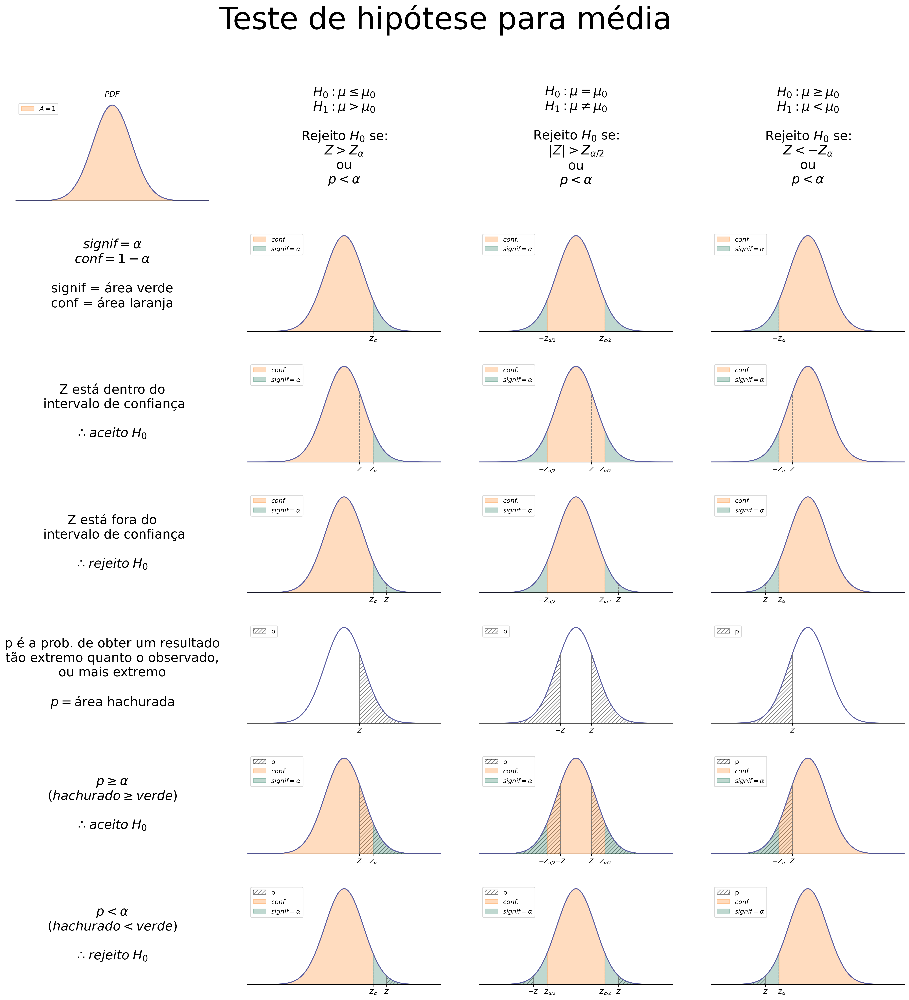

In [2]:
resumo_teste_hipoteses()

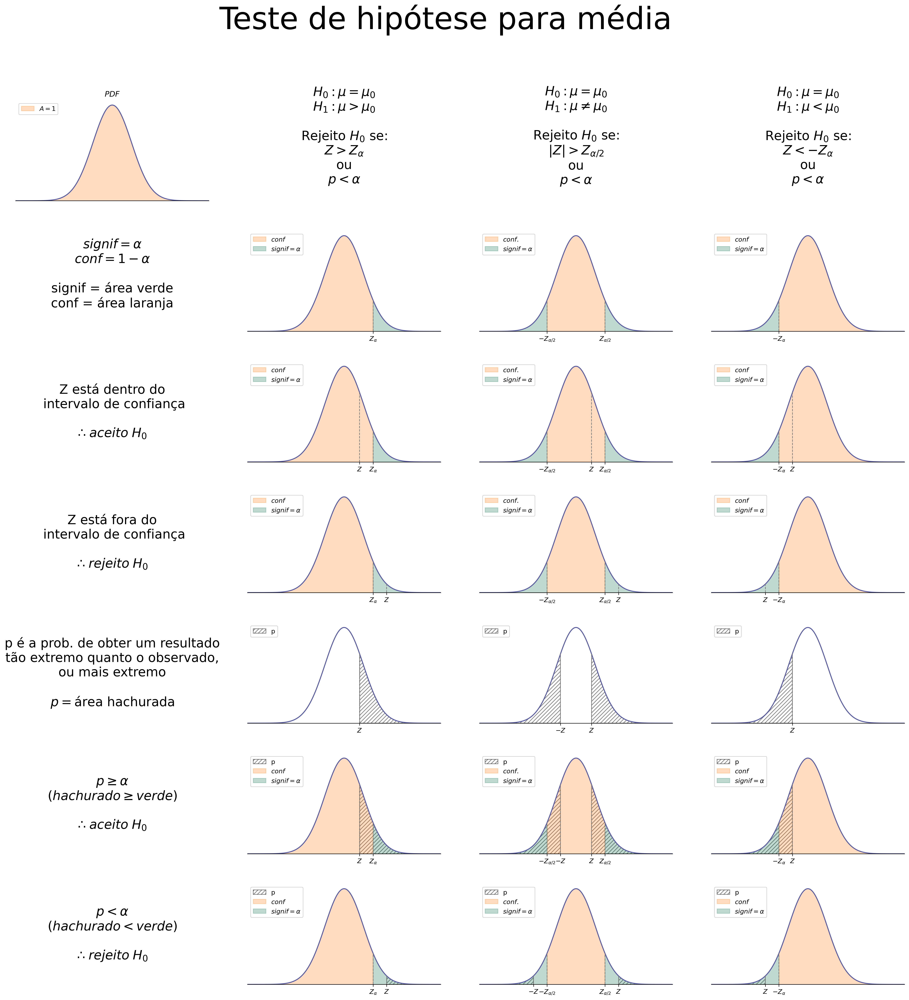

In [3]:
resumo_teste_hipoteses(loose=False)

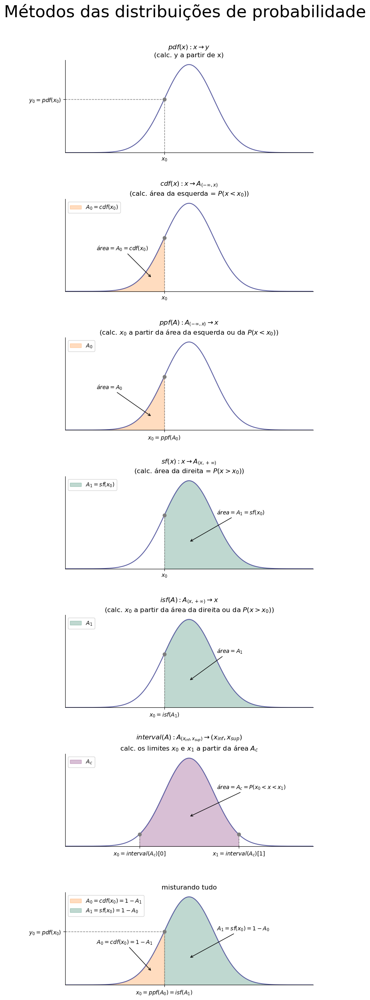

In [4]:
resumo_metodos_distribuicoes()

---

# Exercícios de intervalo de confiança (Class)

Se uma amostra aleatória n=250, tem uma média amostral de 51,3 e uma desvio padrão populacional de σ=2. Construa o intervalo com 95% de confiança para a média populacional μ.

In [5]:
from scipy.stats import norm
import numpy as np

# desvio padrão da média:
confianca = 0.95
significancia = 1 - confianca
med_amostra = 51.3
sigma = 2
n = 250
desvio_med = sigma/np.sqrt(n)
limite_inferior, limite_superior = norm.interval(confianca, loc=med_amostra, scale=desvio_med)
limite_inferior, limite_superior

(51.052081987078175, 51.54791801292182)

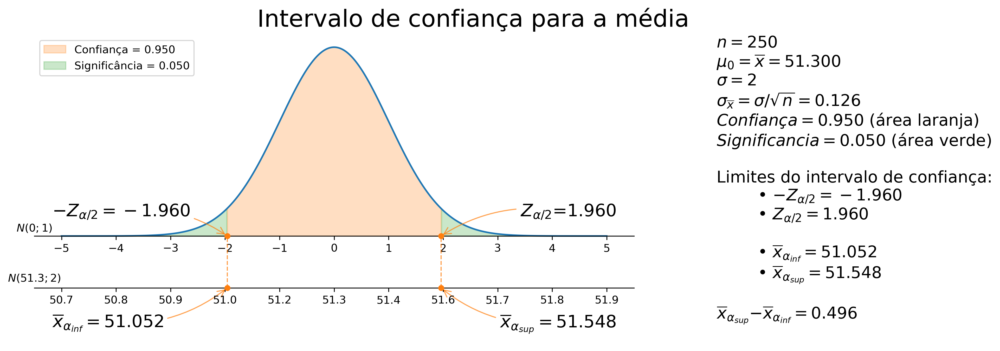

In [6]:
pop_mean_interval(n=250, x_bar=51.3, sigma=2, conf=.95)

---

Sabe-se que a vida em horas de um bulbo de lâmpada de 75 W é distribuída de forma aproximadamente normal com desvio padrão de σ = 25. Uma amostra aleatória de 200 bulbos tem uma vida media de 1.014 horas. Construa um intervalo de confiança de 95% para a vida média.

In [7]:
from scipy.stats import norm
import numpy as np

# desvio padrão da média:
confianca = 0.95
significancia = 1 - confianca
med_amostra = 1014
sigma = 25
n = 200
desvio_med = sigma/np.sqrt(n)
limite_inferior, limite_superior = norm.interval(.95, loc=med_amostra, scale=desvio_med)
limite_inferior, limite_superior

(1010.5352404391258, 1017.4647595608742)

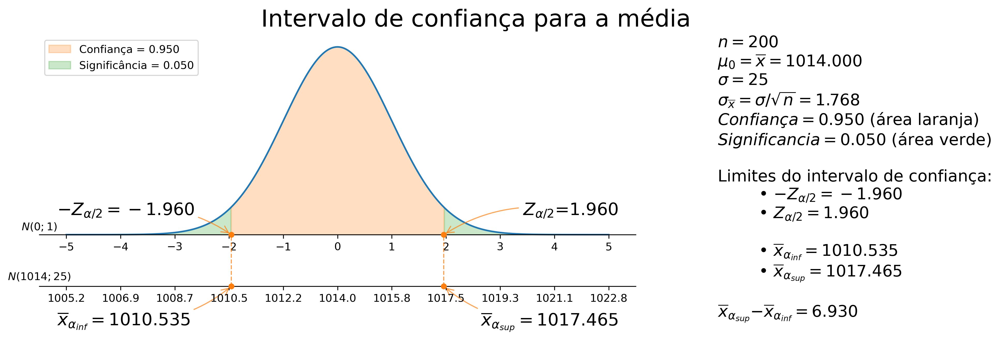

In [8]:
pop_mean_interval(n=200, x_bar=1014, sigma=25, conf=.95)

---

Qual deve ser o tamanho da amostra para que o intervalo com 99,5% de confiança para a média populacional tenha uma semi-amplitude (ou erro) não superior a 1,5? Sabe-se que a variância populacional é de 23.

In [9]:
import math
from scipy.stats import norm
import numpy as np

#Encontra o desvio padrão a partir de um intervalo e sua confiança
def norm_find_sigma(alpha, interval):
    z = -norm.ppf((1-alpha)/2)
    z_i = interval/2
    return z_i/z

confianca = 0.995
sigma = np.sqrt(23)
semi_amplitude = 1.5
amplitude = 2*semi_amplitude
desv_media_amostra = norm_find_sigma(confianca, amplitude)
n = math.ceil((sigma/desv_media_amostra)**2)
n

81

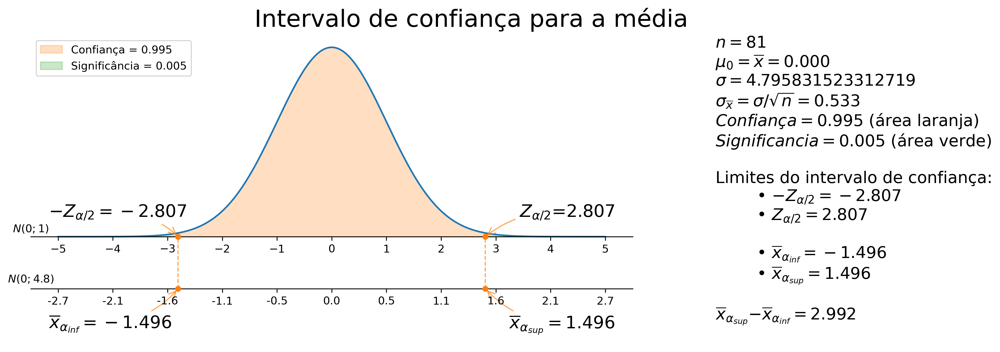

In [10]:
pop_mean_interval(n=81, x_bar=0, sigma=np.sqrt(23), conf=.995)

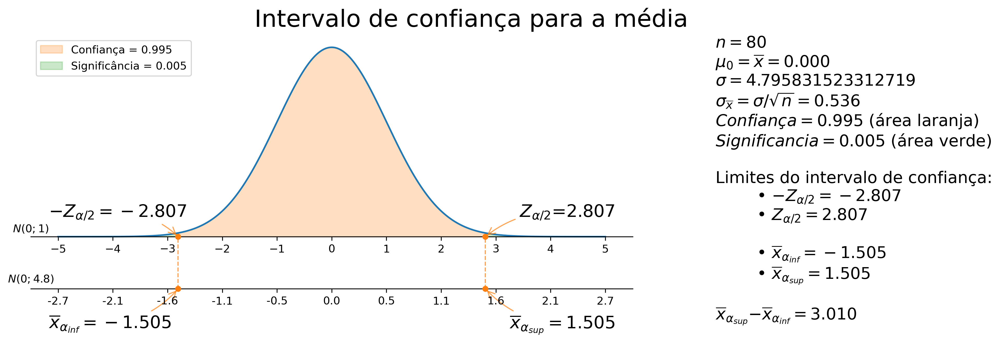

In [11]:
pop_mean_interval(n=80, x_bar=0, sigma=np.sqrt(23), conf=.995)

---

Uma marca particular de margarina diet foi analisada para determinar o nível em porcentagem de ácidos graxos insaturados. Uma amostra de seis pacotes resultou nos seguintes dados: 16,8; 17,2; 17,4; 16,9; 16,5 e 17,1. Encontre o intervalo de confiança de 99% para a amostra.

In [12]:
amostras = [16.8, 17.2, 17.4, 16.9, 16.5, 17.1]

from scipy.stats import t
import numpy as np

# desvio padrão da média:
confianca = 0.99
med_amostra = np.mean(amostras)
sigma = np.std(amostras, ddof=1)
n = len(amostras)
ddof = n-1
desvio_med = sigma/np.sqrt(n)

limite_inf, limite_sup = t.interval(confianca, loc=med_amostra, scale=desvio_med, df=ddof)
limite_inf, limite_sup

(16.458465942824343, 17.508200723842325)

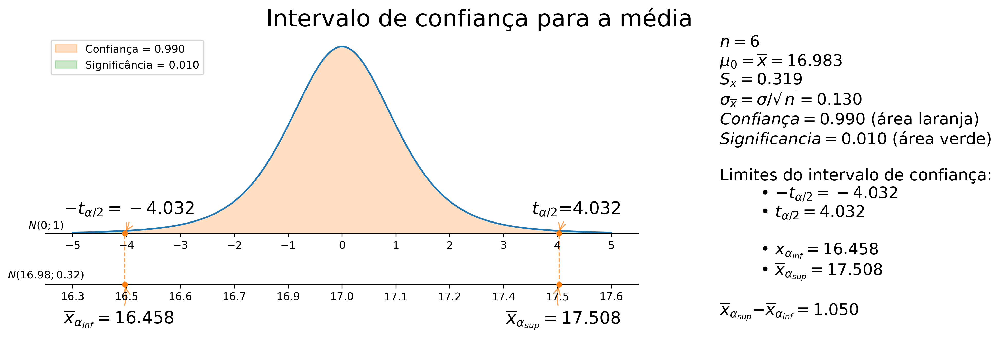

In [13]:
pop_mean_interval(n=n, x_bar=med_amostra, sigma=sigma, conf=confianca, dist="student")

---

Uma amostra piloto com 12 elementos tem média de 6,7 e desvio padrão de 1,7. Qual deve ser o tamanho da amostra para que a semi amplitude do intervalo de 99,5% de confiança da média populacional não seja superior a 0,8.

In [14]:
from scipy.stats import t
import numpy as np

#Encontra o desvio padrão a partir de um intervalo e sua confiança
def t_find_sigma(alpha, interval, df):
    z = -t.ppf((1-alpha)/2, df)
    z_i = interval/2
    return z_i/z

n=12 
ddof=n-1 
confianca = 0.995 
sigma = 1.7 
semi_amplitude = .8 
amplitude = 2*semi_amplitude
desv_media_amostra = t_find_sigma(confianca, amplitude, ddof)
n = math.ceil((sigma/desv_media_amostra)**2)
n

56

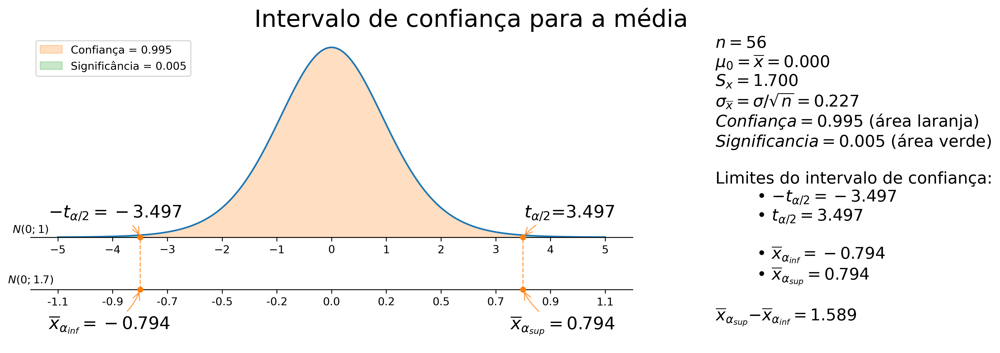

In [15]:
pop_mean_interval(n=56, x_bar=0, sigma=sigma, conf=confianca, dist="student", n_student=12)

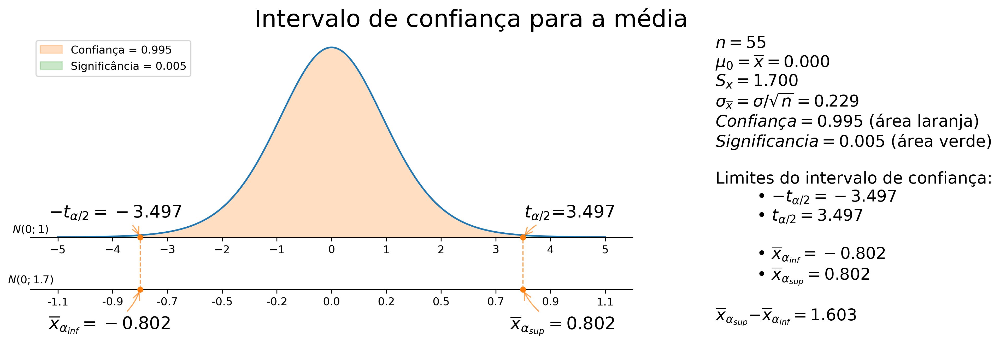

In [16]:
pop_mean_interval(n=55, x_bar=0, sigma=sigma, conf=confianca, dist="student", n_student=12)

---

Calcular o intervalo de confiança de 95% para a seguinte amostra, com variância populacional desconhecida:

`19,8; 18,5; 17,6; 16,7; 15,8; 15,4; 14,1; 13,6; 11,9; 11,4; 11,4; 8,8; 7,5; 15,4; 15,4; 19,5; 14,9; 12,7; 11,9; 11,4; 10,1; 7,9`

In [17]:
from scipy.stats import t
import numpy as np

amostras = [19.8, 18.5, 17.6, 16.7, 15.8, 15.4, 14.1, 13.6, 11.9, 11.4, 11.4, 8.8, 7.5, 15.4, 15.4, 19.5, 14.9, 12.7, 11.9, 11.4, 10.1, 7.9]

confianca = 0.95 
med_amostra = np.mean(amostras) 
sigma = np.std(amostras, ddof=1) 
n = len(amostras) 
ddof = n-1 
sigma_media_pop = sigma/np.sqrt(n) 
limite_inf, limite_sup = t.interval(confianca, loc=med_amostra, scale=sigma_media_pop, df=ddof) 
limite_inf, limite_sup

(12.138069152904343, 15.289203574368383)

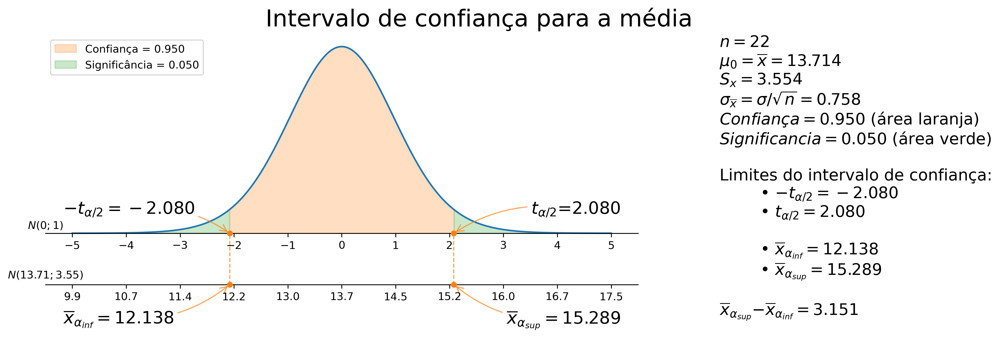

In [18]:
pop_mean_interval(n=n, x_bar=med_amostra, sigma=sigma, conf=confianca, dist="student")

---
---
---

# Exercícios de teste de hipótese (Class)

Um fabricante de farinha afirma que a quantidade média de farinha nas embalagens de seu principal produto é de 500 g. Um teste de pesagem em 30 embalagens amostradas ao acaso mostrou um peso médio igual à 485 g. Estudos anteriores afirmam que a distribuição dos pesos segue uma normal e que o desvio padrão populacional é igual a 20 g. Considerando um nível de significância igual a 5%, responda as seguintes questões:

1) Qual a hipótese nula a ser testada?

2) Qual o valor da estatística de teste?

3) Qual a conclusão do teste?

1) $H_0: \mu = 500$

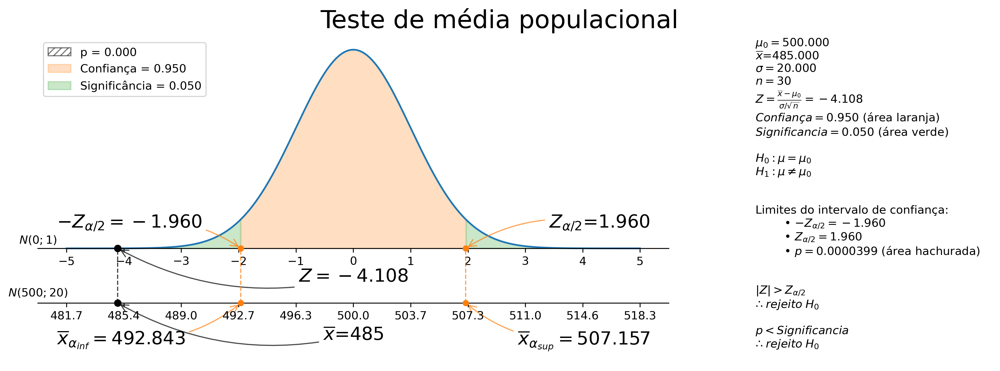

In [19]:
significancia = 0.05
confianca = 1-significancia
pop_mean_test(mu=500, n=30, x_bar=485, sigma=20, conf=confianca, alt_hip="different")

2) $Z = -4.108$
3) $rejeito\;H_0$

---

Considere novamente os dados do exercício anterior. Um fabricante de farinha afirma que a quantidade média de farinha nas embalagens de seu principal produto é de 500 g. Um teste de pesagem em 30 embalagens amostradas ao acaso mostrou um peso médio igual à 485 g. Estudos anteriores afirmam que a distribuição dos pesos segue uma normal e que o desvio padrão populacional é igual a 20 g. Com um nível de significância igual a 5%, teste a hipótese nula de que a média do processo é igual a 500 g e marque a alternativa que indica o p-valor do teste aplicado (considere somente 5 casas decimais).

$p=0.0000399$

---

A empresa Limpa Esgoto garante ser capaz de realizar o tratamento de esgoto e obter, no máximo, 150 g de impurezas para cada mil litros de esgoto tratado. Vinte amostras de mil litros de esgoto apresentaram, em média, 230 g de impurezas e desvio padrão amostral igual a 90 g.

Assumindo alfa igual a 5% e população normalmente distribuída, seria possível discordar da empresa Limpa Esgoto? Assinale a alternativa que apresenta a estatística de teste e a decisão correta do teste.

$H_0: \mu\leq 150g/1000l$

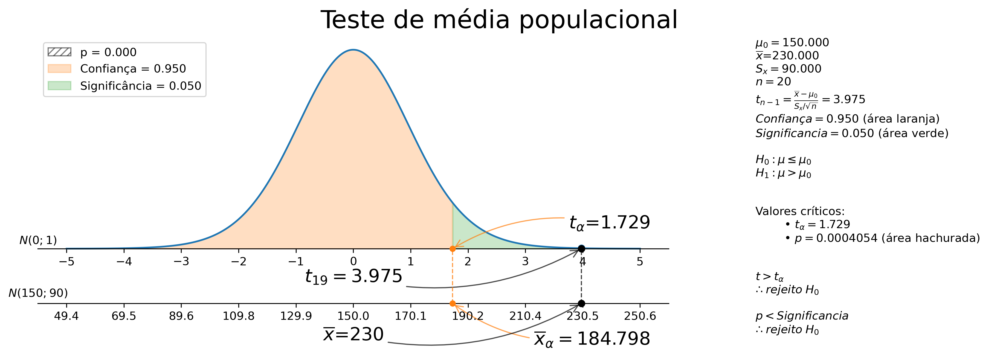

In [20]:
significancia = 0.05
confianca = 1-significancia
pop_mean_test(mu=150, n=20, x_bar=230, sigma=90, conf=confianca, alt_hip="greater", dist='student')

$t=3.975$

$rejeito\;H_0$

---

A pizzaria Muito Queijo alega que a quantidade de queijo em suas pizzas tamanho família é de, no mínimo, 350 g. Uma amostra de 35 pizzas tamanho família revelou uma média de 330 g de queijo por pizza. O desvio padrão amostral foi de 80 g.

Assumindo alfa igual a 5% e população normalmente distribuída, seria possível discordar da alegação da pizzaria? Assinale a alternativa que apresenta a estatística de teste e a decisão correta do teste.

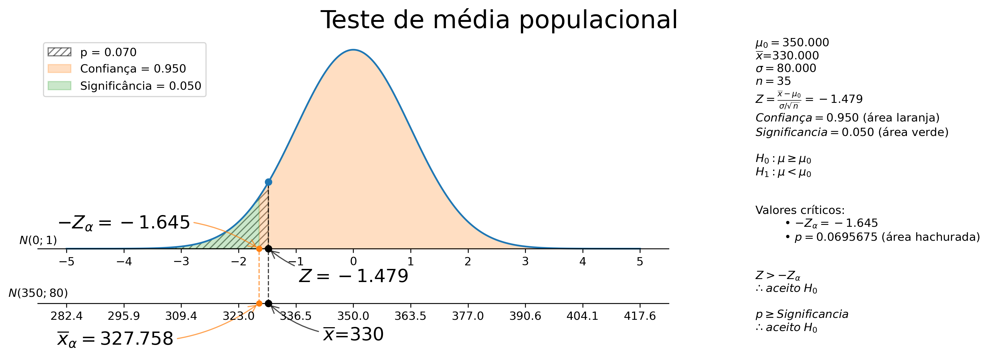

In [21]:
significancia = 0.05
confianca = 1-significancia
pop_mean_test(mu=350, n=35, x_bar=330, sigma=80, conf=confianca, alt_hip="less")

$Z=-1.479$

$aceito\;H_0$

---
---
---

# Extras de teste de hipótese 

["Introductory Statistics" by Shafer and Zhang.](https://stats.libretexts.org/Bookshelves/Introductory_Statistics/Book%3A_Introductory_Statistics_(Shafer_and_Zhang)/08%3A_Testing_Hypotheses/8.E%3A_Testing_Hypotheses_(Exercises)) - Applications

A lawyer believes that a certain judge imposes prison sentences for property crimes that are longer than the state average  11.7  months. He randomly selects  36  of the judge’s sentences and obtains mean  13.8  and standard deviation  3.9  months.

a) Perform the test at the  1%  level of significance using the critical value approach.

b) Compute the observed significance of the test.

c) Perform the test at the  1%  level of significance using the  p -value approach. You need not repeat the first three steps, already done in part (a).

- $H_0$: judge imposes sentences that are **NO** longer than the state average
- $H_1$: judge imposes sentences that are **NO** longer than the state average

or
- $H_0:\mu_{judge}\leq11.7$
- $H_1:\mu_{judge}>11.7$

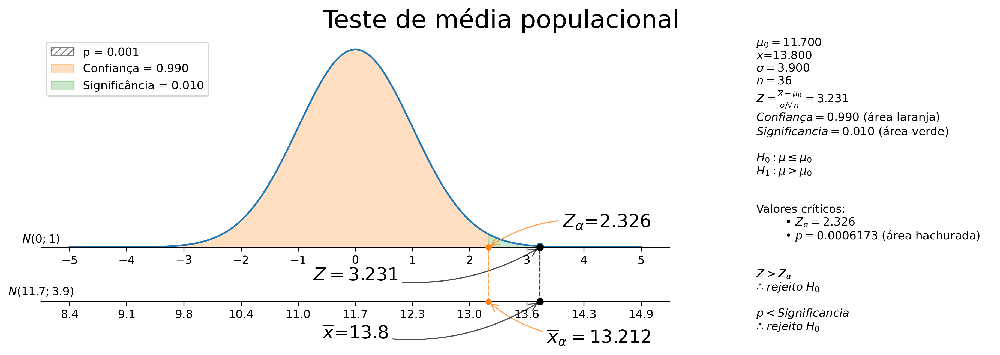

In [22]:
signif = 0.01
conf = 1-signif
pop_mean_test(mu=11.7, n=36, x_bar=13.8, sigma=3.9, conf=conf, alt_hip="greater")

(bateu com o gabarito)
1.  $Z=3.231$</br>$Z_\alpha=2.326$ </br> $Z>Z_\alpha$</br>$\therefore reject\;H_0$
</br></br>
1.  $p = 0.0006173$
</br></br>
1.  $p = 0.0006, \alpha = 0.200$ </br> $p<\alpha$ </br> $\therefore reject\;H_0$

---

In a recent year the fuel economy of all passenger vehicles was  19.8  mpg. A trade organization sampled  50  passenger vehicles for fuel economy and obtained a sample mean of  20.1  mpg with standard deviation  2.45  mpg. The sample mean  20.1  exceeds  19.8 , but perhaps the increase is only a result of sampling error.

a)  Perform the relevant test of hypotheses at the  20%  level of significance using the critical value approach.

b)  Compute the observed significance of the test.

c)  Perform the test at the  20%  level of significance using the  p -value approach. You need not repeat the first three steps, already done in part (a).

- $H_0:\mu\leq19.8$
- $H_1:\mu>19.8$

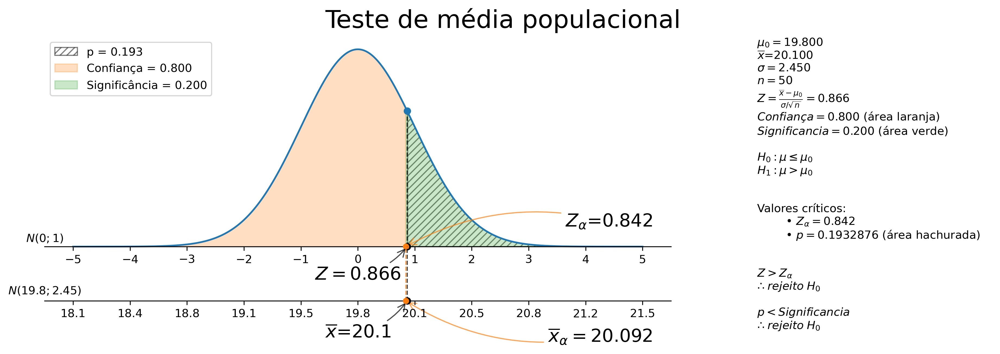

In [23]:
signif = 0.20
conf = 1-signif
pop_mean_test(mu=19.8, n=50, x_bar=20.1, sigma=2.45, conf=conf, alt_hip="greater")

(ex. sem gabarito)
1.  $Z=0.866$</br>$Z_\alpha=0.842$ </br> $Z>Z_\alpha$</br>$\therefore reject\;H_0$
</br></br>
1.  $p = 0.1932876$
</br></br>
1.  $p = 0.193, \alpha = 0.200$ </br> $p<\alpha$ </br> $\therefore reject\;H_0$

---

The mean score on a  25 -point placement exam in mathematics used for the past two years at a large state university is  14.3 . The placement coordinator wishes to test whether the mean score on a revised version of the exam differs from  14.3 . She gives the revised exam to  30  entering freshmen early in the summer; the mean score is  14.6  with standard deviation  2.4 .

a)  Perform the test at the  10%  level of significance using the critical value approach.

b)  Compute the observed significance of the test.

c)  Perform the test at the  10%  level of significance using the  p -value approach. You need not repeat the first three steps, already done in part (a).

- $H_0:\mu=14.3$
- $H_1:\mu\neq14.3$

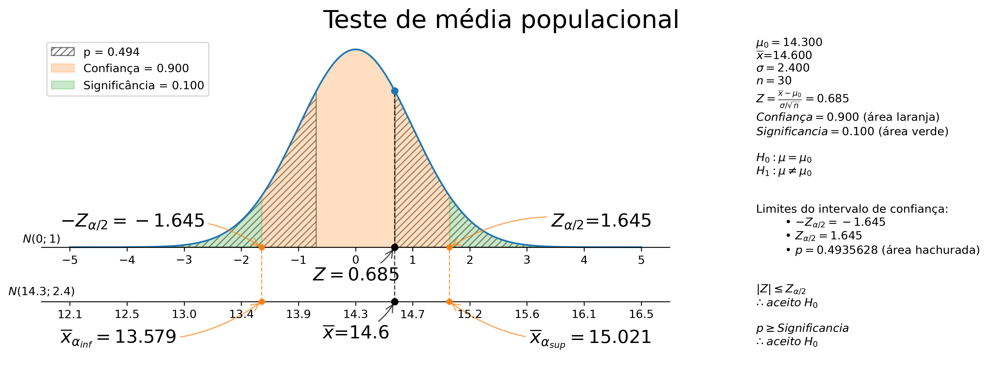

In [24]:
signif = 0.10
conf = 1-signif
pop_mean_test(mu=14.3, n=30, x_bar=14.6, sigma=2.4, conf=conf, alt_hip="different")

(bateu com o gabarito)
1.  $Z=0.685$</br>$-Z_\alpha=1.645$ </br> $|Z|\leq Z_{\alpha/2}$</br>$\therefore accept\;H_0$
</br></br>
1.  $p = 0.4935628$
</br></br>
1.  $p = 0.494, \alpha = 0.100$ </br> $p\geq\alpha$ </br> $\therefore accept\;H_0$

---

The mean increase in word family vocabulary among students in a one-year foreign language course is  576  word families. In order to estimate the effect of a new type of class scheduling, an instructor monitors the progress of  60  students; the sample mean increase in word family vocabulary of these students is  542  word families with sample standard deviation  18  word families.

a)  Test at the  5%  level of significance whether the mean increase with the new class scheduling is different from  576  word families, using the critical value approach.

b) Compute the observed significance of the test.

c) Perform the test at the  5%  level of significance using the  p -value approach. You need not repeat the first three steps, already done in part (a).

- $H_0:\mu=576$
- $H_1:\mu\neq576$

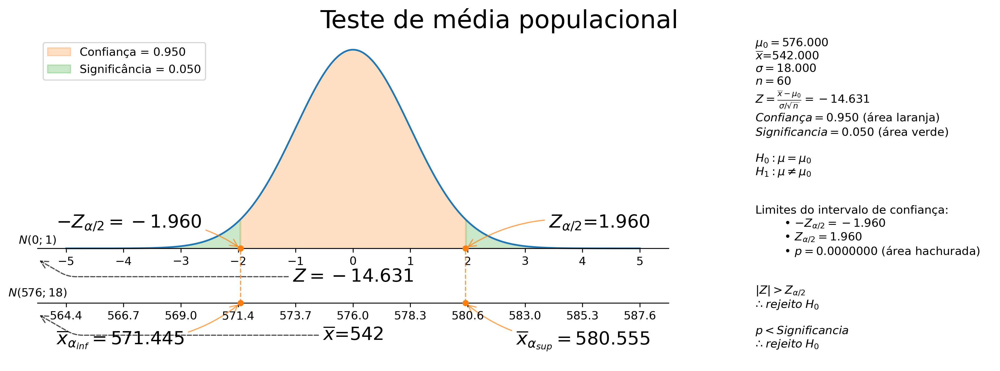

In [25]:
signif = 0.05
conf = 1-signif
pop_mean_test(mu=576, n=60, x_bar=542, sigma=18, conf=conf, alt_hip="different")

(ex. sem gabarito)
1.  $Z=-14.631$</br>$-Z_\alpha=1.960$ </br> $|Z|> Z_{\alpha/2}$</br>$\therefore reject\;H_0$
</br></br>
1.  $p = 0$
</br></br>
1.  $p = 0.0, \alpha = 0.05$ </br> $p<\alpha$ </br> $\therefore reject\;H_0$

---

The mean yield for hard red winter wheat in a certain state is  44.8  bu/acre. In a pilot program a modified growing scheme was introduced on  35  independent plots. The result was a sample mean yield of  45.4  bu/acre with sample standard deviation  1.6  bu/acre, an apparent increase in yield.

a)  Test at the  5%  level of significance whether the mean yield under the new scheme is greater than  44.8  bu/acre, using the critical value approach.

b)  Compute the observed significance of the test.

c)  Perform the test at the  5%  level of significance using the  p -value approach. You need not repeat the first three steps, already done in part (a).

- $H_0:\mu\leq44.8$
- $H_1:\mu>44.8$

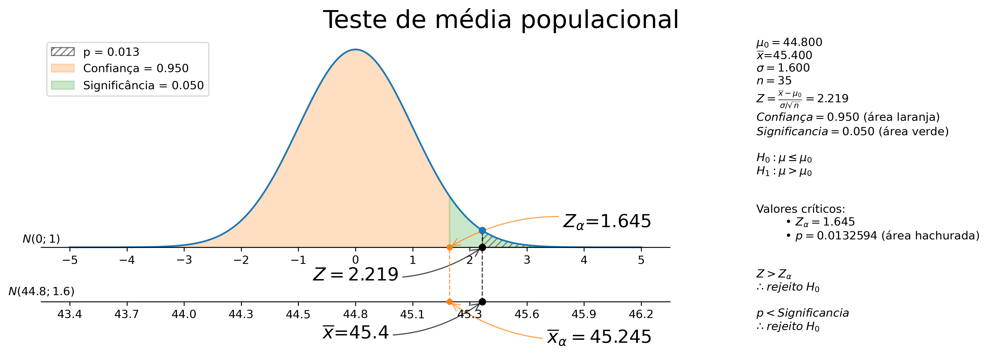

In [26]:
signif = 0.05
conf = 1-signif
pop_mean_test(mu=44.8, n=35, x_bar=45.4, sigma=1.6, conf=conf, alt_hip="greater")

(bateu com gabarito)
1.  $Z=-2.219$</br>$-Z_\alpha=-1.645$ </br> $Z>Z_\alpha$</br>$\therefore reject\;H_0$
</br></br>
1.  $p = 0.0132594$
</br></br>
1.  $p = 0.013, \alpha = 0.05$ </br> $p<\alpha$ </br> $\therefore reject\;H_0$

---

The average amount of time that visitors spent looking at a retail company’s old home page on the world wide web was  23.6  seconds. The company commissions a new home page. On its first day in place the mean time spent at the new page by  7,628  visitors was  23.5  seconds with standard deviation  5.1  seconds.

a)  Test at the  5%  level of significance whether the mean visit time for the new page is less than the former mean of  23.6  seconds, using the critical value approach.

b)  Compute the observed significance of the test.

c)  Perform the test at the  5%  level of significance using the  p -value approach. You need not repeat the first three steps, already done in part (a).

- $H_0:\mu\geq23.6$
- $H_1:\mu<23.6$

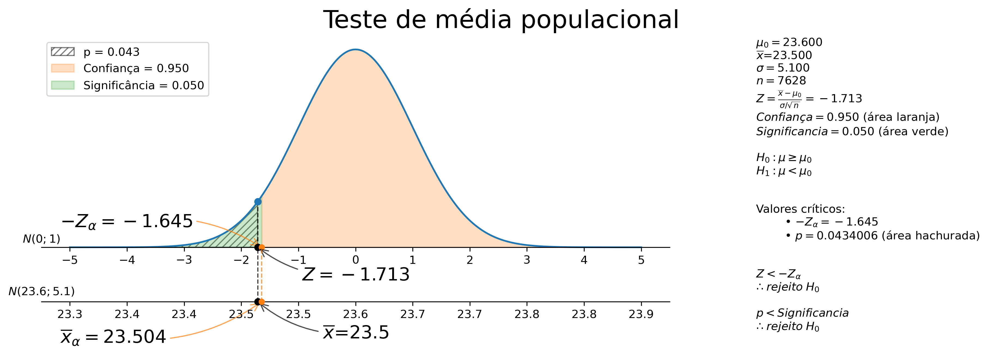

In [27]:
signif = 0.05
conf = 1-signif
pop_mean_test(mu=23.6, n=7628, x_bar=23.5, sigma=5.1, conf=conf, alt_hip="less")

(ex. sem gabarito)
1.  $Z=-1.713$</br>$-Z_\alpha=-1.645$ </br> $Z< -Z_\alpha$</br>$\therefore reject\;H_0$
</br></br>
1.  $p = 0.0434006$
</br></br>
1.  $p = 0.043, \alpha = 0.05$ </br> $p<\alpha$ </br> $\therefore reject\;H_0$

---

Researchers wish to test the efficacy of a program intended to reduce the length of labor in childbirth. The accepted mean labor time in the birth of a first child is  15.3  hours. The mean length of the labors of  13  first-time mothers in a pilot program was  8.8  hours with standard deviation  3.1  hours. Assuming a normal distribution of times of labor, test at the  10%  level of significance test whether the mean labor time for all women following this program is less than  15.3  hours.

- $H_0:\mu\geq15.3$
- $H_1:\mu<15.3$

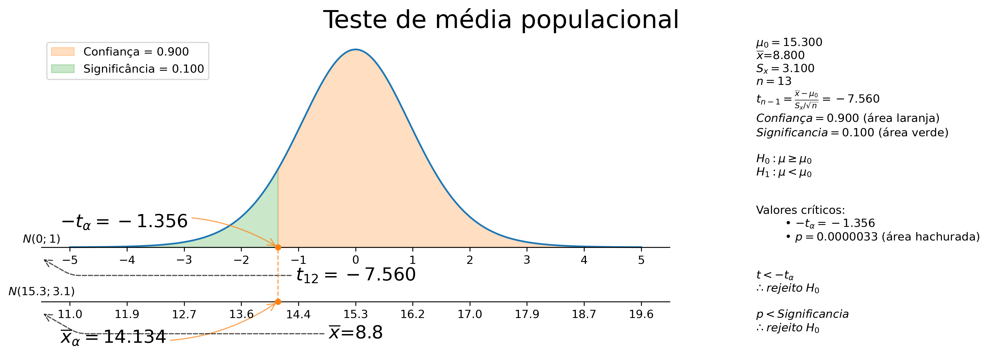

In [28]:
signif = 0.10
conf = 1-signif
pop_mean_test(mu=15.3, n=13, x_bar=8.8, sigma=3.1, conf=conf, alt_hip="less", dist='student')

(bateu com o gabarito)
- At the  10%  level of significance, the mean labor time for all women following this program is less than  15.3  hours

---

A dairy farm uses the somatic cell count (SCC) report on the milk it provides to a processor as one way to monitor the health of its herd. The mean SCC from five samples of raw milk was  250,000  cells per milliliter with standard deviation  37,500  cell/ml. Test whether these data provide sufficient evidence, at the  10%  level of significance, to conclude that the mean SCC of all milk produced at the dairy exceeds that in the previous report,  210,250  cell/ml. Assume a normal distribution of SCC.

- $H_0:\mu\leq210250$
- $H_1:\mu>210250$

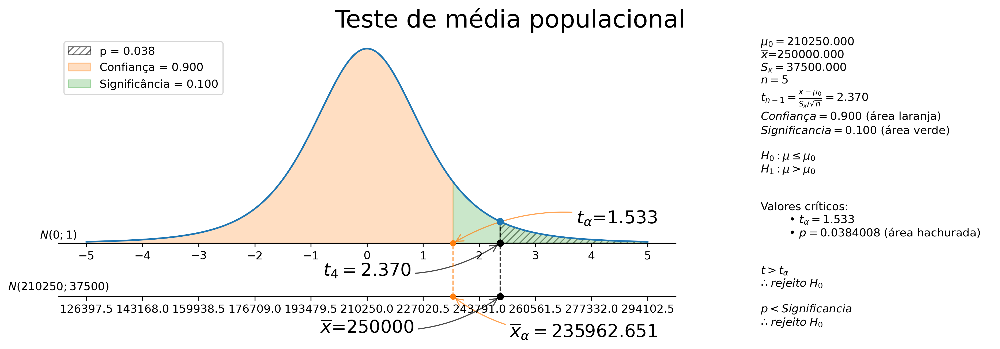

In [29]:
signif = 0.10
conf = 1-signif
pop_mean_test(mu=210250, n=5, x_bar=250000, sigma=37500, conf=conf, alt_hip="greater", dist='student')

(ex. sem gabarito)
-  at the  10%  level of significance, the mean SCC of all milk produced at the dairy exceeds 210250 cell/ml

---

Six coins of the same type are discovered at an archaeological site. If their weights on average are significantly different from  5.25  grams then it can be assumed that their provenance is not the site itself. The coins are weighed and have mean  4.73  g with sample standard deviation  0.18  g. Perform the relevant test at the  0.1%  ( 1/10th of1% ) level of significance, assuming a normal distribution of weights of all such coins.

- $H_0:\mu=5.25$
- $H_1:\mu\neq5.25$

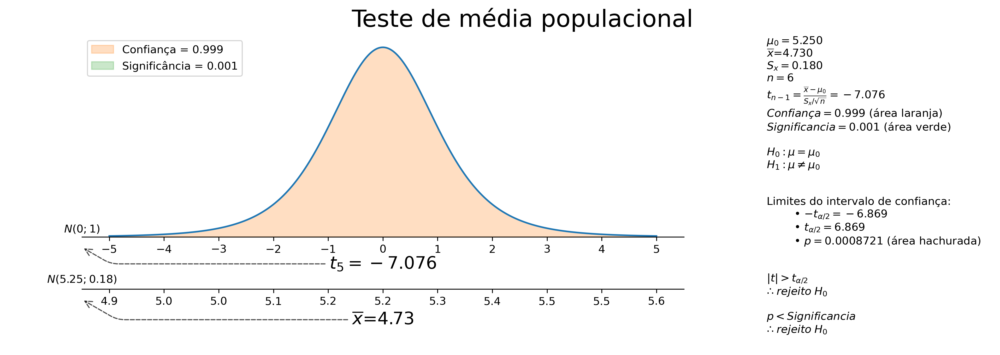

In [30]:
signif = 0.001
conf = 1-signif
pop_mean_test(mu=5.25, n=6, x_bar=4.73, sigma=0.18, conf=conf, alt_hip="different", dist='student')

(bateu com o gabarito)
- at the  0.1% level of significance, their weights on average are significantly different from  5.25  grams

---

An economist wishes to determine whether people are driving less than in the past. In one region of the country the number of miles driven per household per year in the past was  18.59  thousand miles. A sample of  15  households produced a sample mean of  16.23  thousand miles for the last year, with sample standard deviation  4.06  thousand miles. Assuming a normal distribution of household driving distances per year, perform the relevant test at the  5%  level of significance.

- $H_0:\mu\geq18.59$
- $H_1:\mu<q18.59$

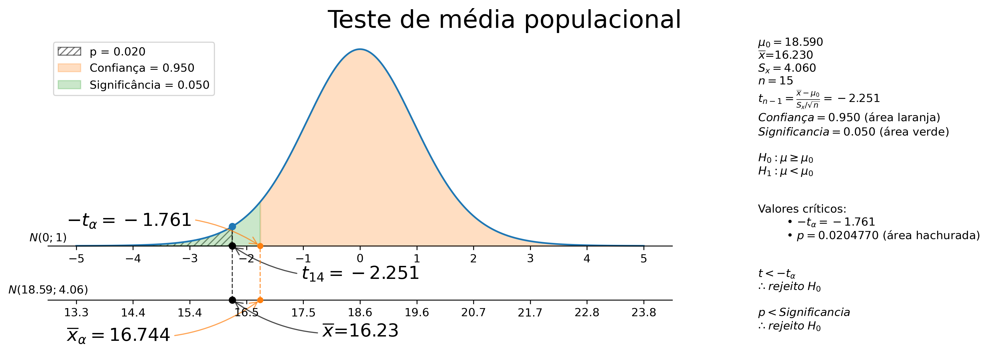

In [31]:
signif = 0.05
conf = 1-signif
pop_mean_test(mu=18.59, n=15, x_bar=16.23, sigma=4.06, conf=conf, alt_hip="less", dist='student')

(ex. sem gabarito)
- at the  5%  level of significance people are **NOT** driving less than in the past

---

The recommended daily allowance of iron for females aged  19−50  is  18  mg/day. A careful measurement of the daily iron intake of  15  women yielded a mean daily intake of  16.2  mg with sample standard deviation  4.7  mg.
1. Assuming that daily iron intake in women is normally distributed, perform the test that the actual mean daily intake for all women is different from  18  mg/day, at the  10%  level of significance.
1. The sample mean is less than  18 , suggesting that the actual population mean is less than  18  mg/day. Perform this test, also at the  10%  level of significance. (The computation of the test statistic done in part (a) still applies here.)

1.
    - $H_0:\mu=18$
    - $H_1:\mu\neq18$

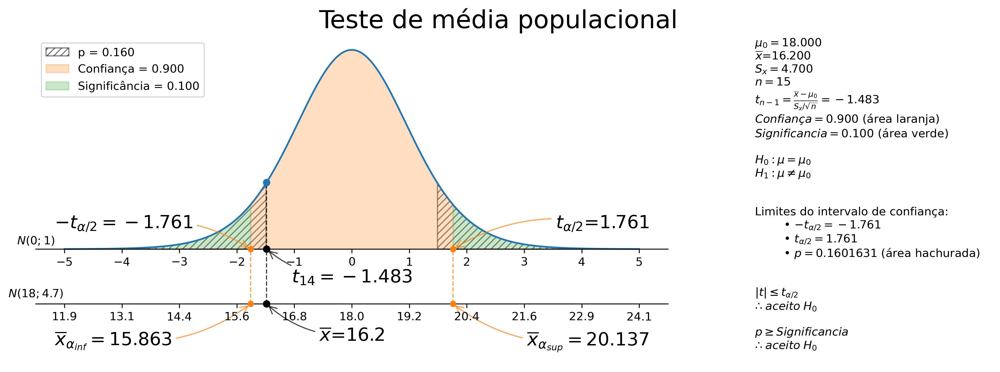

In [32]:
signif = 0.10
conf = 1-signif
pop_mean_test(mu=18, n=15, x_bar=16.2, sigma=4.7, conf=conf, alt_hip="different", dist='student')

(bateu com o gabarito)
- at the  10%  level of significance, the actual mean daily intake for all women is 18 mg/day

2.
    - $H_0:\mu\geq18$
    - $H_1:\mu<18$

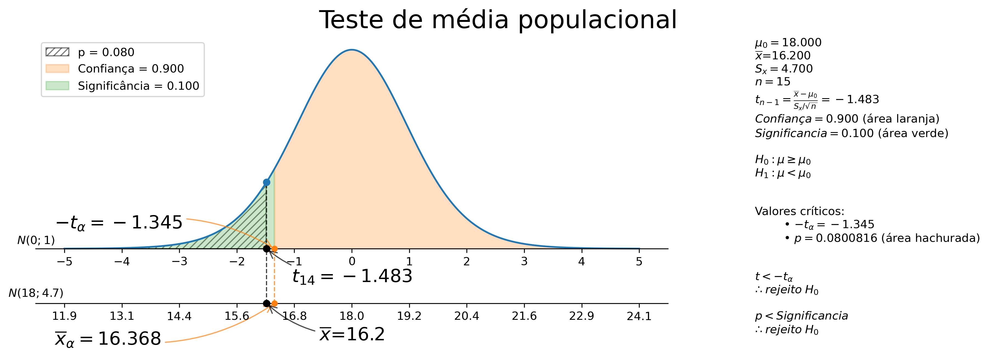

In [33]:
signif = 0.10
conf = 1-signif
pop_mean_test(mu=18, n=15, x_bar=16.2, sigma=4.7, conf=conf, alt_hip="less", dist='student')

(bateu com o gabarito)
- at the  10%  level of significance, the actual population mean is less than 18 mg/day

---

The target temperature for a hot beverage the moment it is dispensed from a vending machine is  170°F . A sample of ten randomly selected servings from a new machine undergoing a pre-shipment inspection gave mean temperature  173°F  with sample standard deviation  6.3°F .
1. Assuming that temperature is normally distributed, perform the test that the mean temperature of dispensed beverages is different from  170°F , at the  10%  level of significance.
1. The sample mean is greater than  170 , suggesting that the actual population mean is greater than  170°F . Perform this test, also at the  10%  level of significance. (The computation of the test statistic done in part (a) still applies here.)

1.
    - $H_0:\mu=170$
    - $H_1:\mu\neq170$

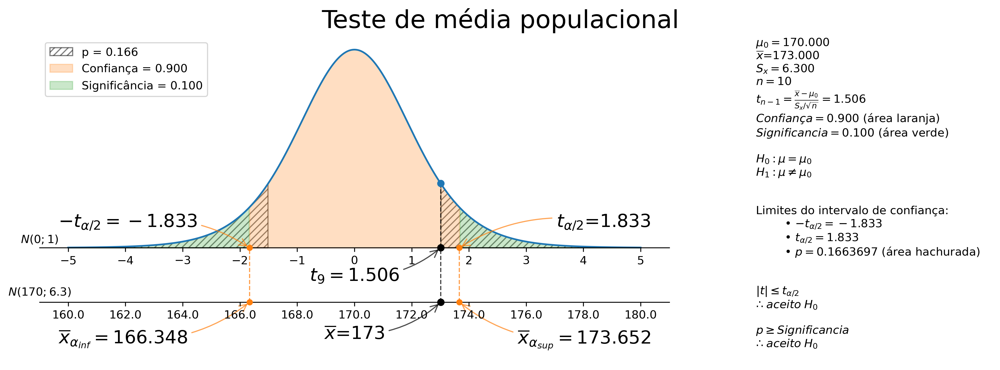

In [34]:
signif = 0.10
conf = 1-signif
pop_mean_test(mu=170, n=10, x_bar=173, sigma=6.3, conf=conf, alt_hip="different", dist='student')

(ex. sem gabarito)
- at the  10%  level of significance, the mean temperature of dispensed beverages is 170°F

2.
    - $H_0:\mu<170$
    - $H_1:\mu\geq18$

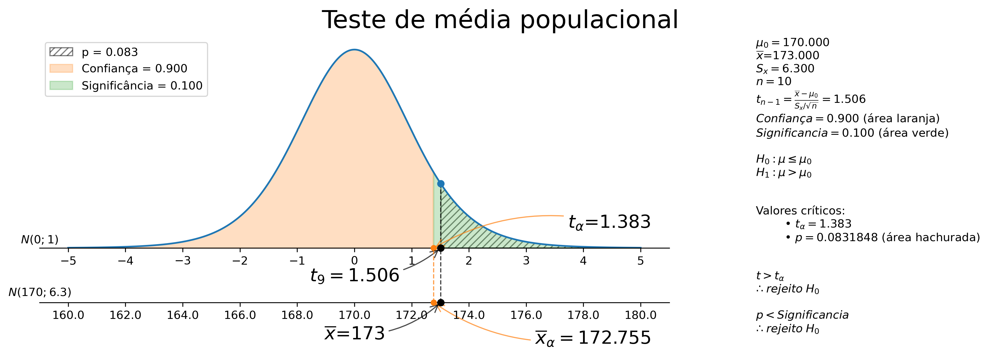

In [35]:
signif = 0.10
conf = 1-signif
pop_mean_test(mu=170, n=10, x_bar=173, sigma=6.3, conf=conf, alt_hip="greater", dist='student')

(ex. sem gabarito)
- at the  10%  level of significance, the actual population mean is greater than  170°F

---

The average number of days to complete recovery from a particular type of knee operation is  123.7  days. From his experience a physician suspects that use of a topical pain medication might be lengthening the recovery time. He randomly selects the records of seven knee surgery patients who used the topical medication. The times to total recovery were:

`128 135 121 142 126 151 123`
1. Assuming a normal distribution of recovery times, perform the relevant test of hypotheses at the  10%  level of significance.
1. Would the decision be the same at the  5%  level of significance? Answer either by constructing a new rejection region (critical value approach) or by estimating the  p -value of the test in part (a) and comparing it to  α .

- $H_0:\mu\leq170$
- $H_1:\mu>170$

In [36]:
import numpy as np
samples = [128, 135, 121, 142, 126, 151, 123]
mean = np.mean(samples)
std = np.std(samples, ddof=1)
mean, std

(132.28571428571428, 10.980502200328935)

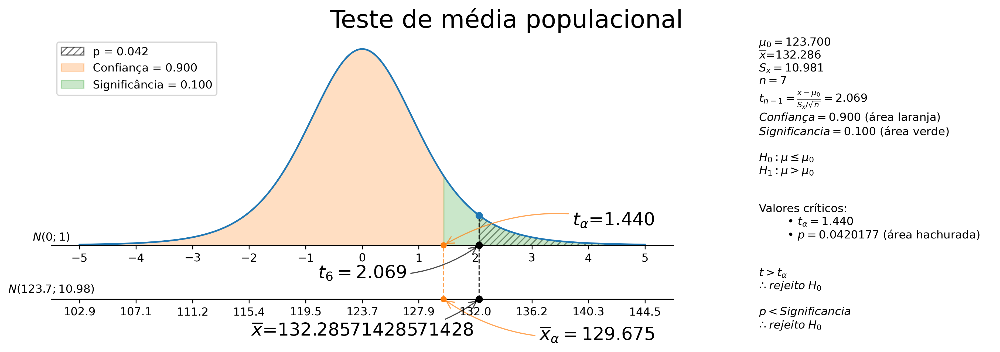

In [37]:
signif = 0.10
conf = 1-signif
pop_mean_test(mu=123.7, n=7, x_bar=mean, sigma=std, conf=conf, alt_hip="greater", dist='student')

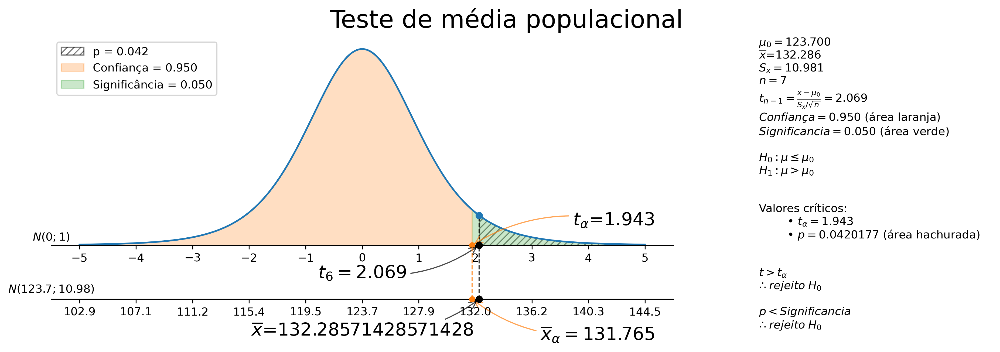

In [38]:
signif = 0.05
conf = 1-signif
pop_mean_test(mu=123.7, n=7, x_bar=mean, sigma=std, conf=conf, alt_hip="greater", dist='student')

(bateu com o gabarito)
- at the 5% and 10% level of significance, the topical pain medication is lengthening the recovery time

---

A 24-hour advance prediction of a day’s high temperature is “unbiased” if the long-term average of the error in prediction (true high temperature minus predicted high temperature) is zero. The errors in predictions made by one meteorological station for  20  randomly selected days were:

```
     2   0  -3   1  -2 
     1   0  -1   1  -1 
    -4   1   1  -4   0 
    -4  -3  -4   2   2
```
1. Assuming a normal distribution of errors, test the null hypothesis that the predictions are unbiased (the mean of the population of all errors is  0 ) versus the alternative that it is biased (the population mean is not  0 ), at the  1%  level of significance.
1. Would the decision be the same at the  5%  level of significance? The  10%  level of significance? Answer either by constructing new rejection regions (critical value approach) or by estimating the  p -value of the test in part (a) and comparing it to  α .

- $H_0:\mu=0$
- $H_1:\mu\neq170$

In [39]:
samples = [2, 0, -3, 1, -2, 1, 0, -1, 1, -1, -4, 1, 1, -4, 0, -4, -3, -4, 2, 2]
n = len(samples)
mean = np.mean(samples)
std = np.std(samples, ddof=1)
n, mean, std

(20, -0.75, 2.2213082915965963)

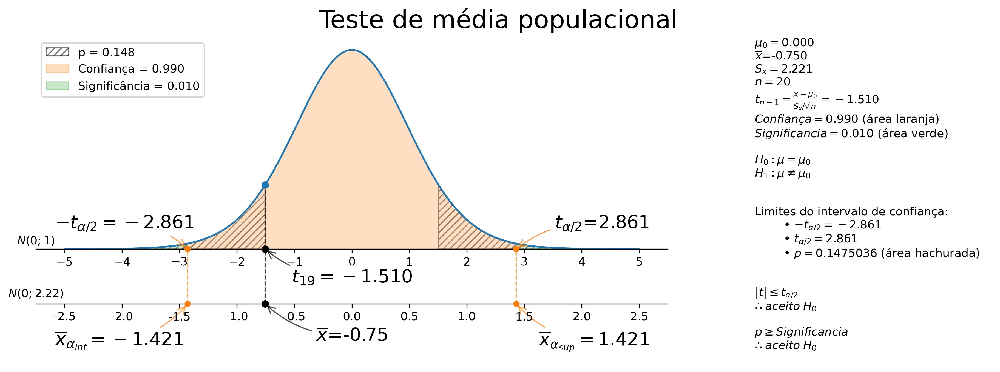

In [40]:
signif = 0.01
conf = 1-signif
pop_mean_test(mu=0, n=n, x_bar=mean, sigma=std, conf=conf, alt_hip="different", dist='student')

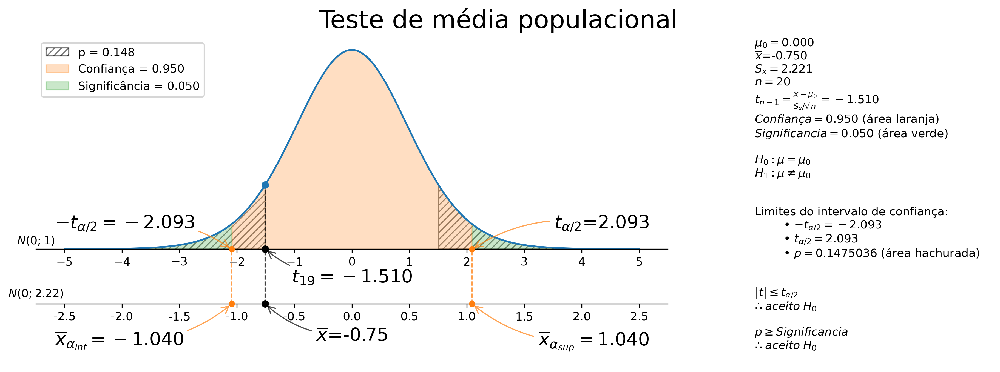

In [41]:
signif = 0.05
conf = 1-signif
pop_mean_test(mu=0, n=n, x_bar=mean, sigma=std, conf=conf, alt_hip="different", dist='student')

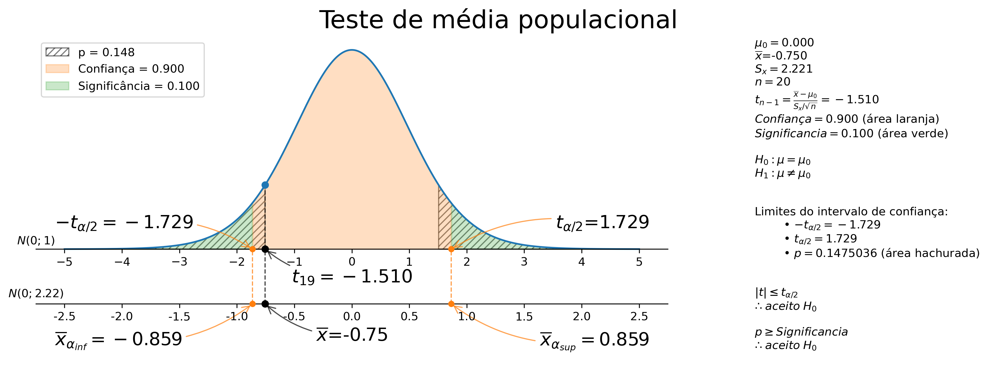

In [42]:
signif = 0.10
conf = 1-signif
pop_mean_test(mu=0, n=n, x_bar=mean, sigma=std, conf=conf, alt_hip="different", dist='student')

(ex. sem gabarito)
- at the 1%, 5%, and 10% level of significance, the predictions are unbiased

---

Pasteurized milk may not have a standardized plate count (SPC) above  20,000  colony-forming bacteria per milliliter (cfu/ml). The mean SPC for five samples was  21,500  cfu/ml with sample standard deviation  750  cfu/ml. Test the null hypothesis that the mean SPC for this milk is  20,000  versus the alternative that it is greater than  20,000 , at the  10%  level of significance. Assume that the SPC follows a normal distribution.

- $H_0:\mu\leq20000$
- $H_1:\mu>20000$

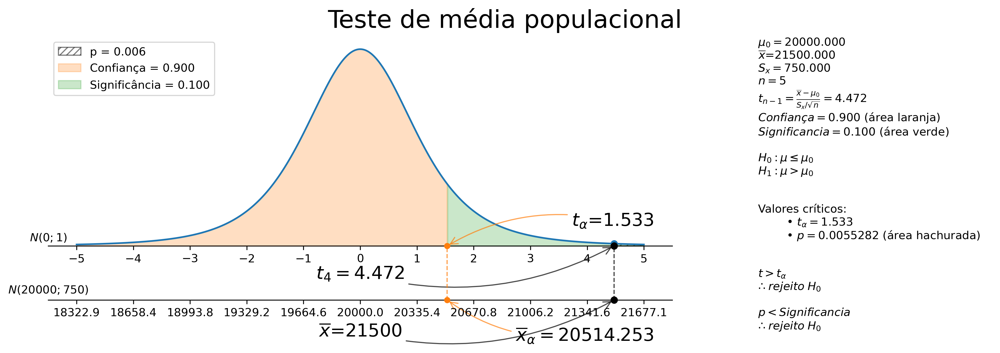

In [43]:
signif = 0.10
conf = 1-signif
pop_mean_test(mu=20000, n=5, x_bar=21500, sigma=750, conf=conf, alt_hip="greater", dist='student')

(bateu com o gabarito)
- at the  10%  level of significance, the mean SPC for this milk is greater than 20000

---

One water quality standard for water that is discharged into a particular type of stream or pond is that the average daily water temperature be at most  18°F . Six samples taken throughout the day gave the data:

`16.8, 21.5, 19.1, 12.8, 18.0, 20.7`

The sample mean   exceeds  $\overline{x}$=18.15 , but perhaps this is only sampling error. Determine whether the data provide sufficient evidence, at the  10%  level of significance, to conclude that the mean temperature for the entire day exceeds  18°F 

- $H_0:\mu\leq18$
- $H_1:\mu>18$

In [44]:
samples = [16.8, 21.5, 19.1, 12.8, 18.0, 20.7]
n = len(samples)
mean = np.mean(samples)
std = np.std(samples, ddof=1)
n, mean, std

(6, 18.150000000000002, 3.1335283627246775)

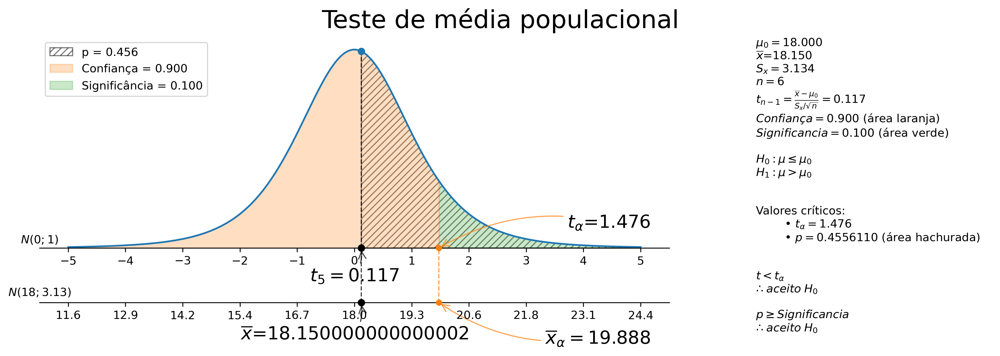

In [45]:
signif = 0.10
conf = 1-signif
pop_mean_test(mu=18, n=n, x_bar=mean, sigma=std, conf=conf, alt_hip="greater", dist='student')

(ex. sem gabarito)
- at the  10%  level of significance, the mean temperature for the entire day doesn't exceeds 18°F

---

A calculator has a built-in algorithm for generating a random number according to the standard normal distribution. Twenty-five numbers thus generated have mean  0.15  and sample standard deviation  0.94 . Test the null hypothesis that the mean of all numbers so generated is  0  versus the alternative that it is different from  0 , at the  20%  level of significance. Assume that the numbers do follow a normal distribution.

- $H_0:\mu=0$
- $H_1:\mu\neq0$

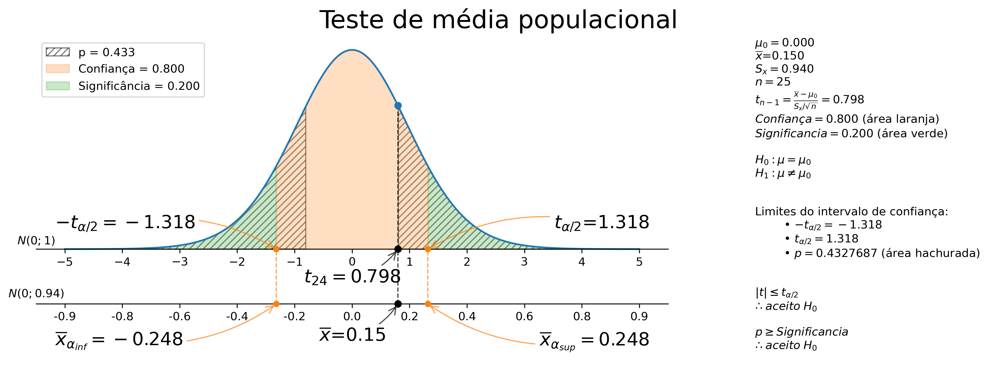

In [46]:
signif = 0.20
conf = 1-signif
pop_mean_test(mu=0, n=25, x_bar=0.15, sigma=.94, conf=conf, alt_hip="different", dist='student')

(bateu com o gabarito)
- at the  20%  level of significance, the mean of all numbers is 0

---

At every setting a high-speed packing machine delivers a product in amounts that vary from container to container with a normal distribution of standard deviation  0.12  ounce. To compare the amount delivered at the current setting to the desired amount  64.1  ounce, a quality inspector randomly selects five containers and measures the contents of each, obtaining sample mean  63.9  ounces and sample standard deviation  0.10  ounce. Test whether the data provide sufficient evidence, at the  5%  level of significance, to conclude that the mean of all containers at the current setting is less than  64.1  ounces.

- $H_0:\mu\geq64.1$
- $H_1:\mu<64.1$

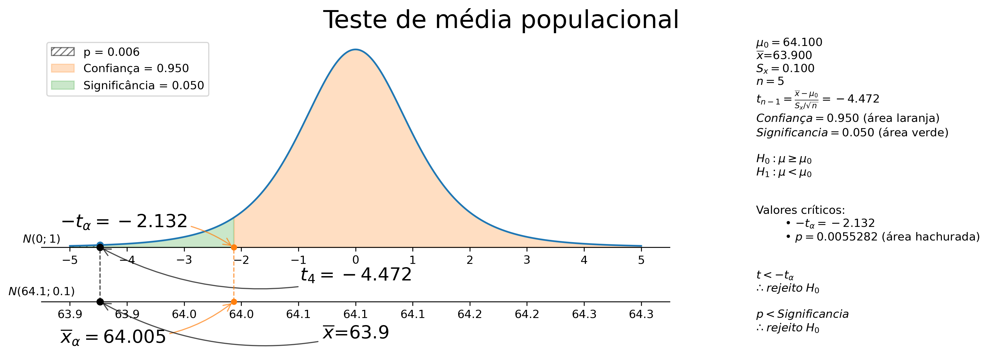

In [47]:
signif = 0.05
conf = 1-signif
pop_mean_test(mu=64.1, n=5, x_bar=63.9, sigma=.10, conf=conf, alt_hip="less", dist='student')

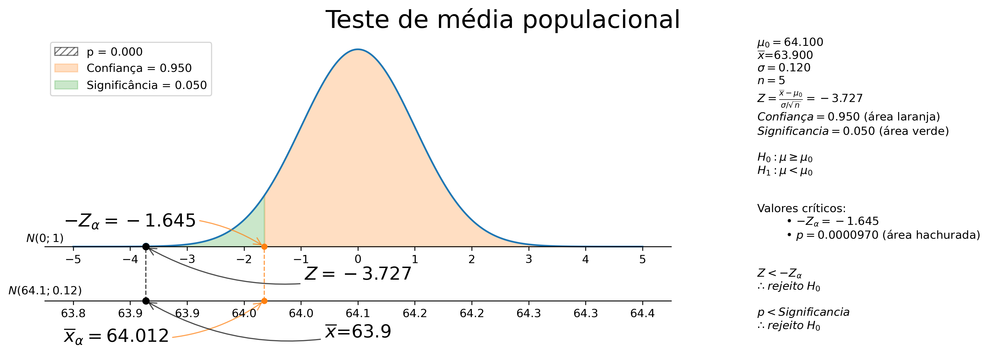

In [48]:
signif = 0.05
conf = 1-signif
pop_mean_test(mu=64.1, n=5, x_bar=63.9, sigma=.12, conf=conf, alt_hip="less")

(ex. sem gabarito)
- Testando a hipótese usando distribuição normal (com o desvio padrão populacional) e usando a t-student (com o desvio padrão amostral), rejeita-se $H_0$
- *Usar desv. populacional e dist. normal parece o mais preciso, mas não tenho certeza

---

A manufacturing company receives a shipment of  1,000  bolts of nominal shear strength  4,350  lb. A quality control inspector selects five bolts at random and measures the shear strength of each. The data are:

`4,320 4,290 4,360 4,350 4,320`
1. Assuming a normal distribution of shear strengths, test the null hypothesis that the mean shear strength of all bolts in the shipment is  4,350  lb versus the alternative that it is less than  4,350  lb, at the  10%  level of significance.
1. Estimate the  p -value (observed significance) of the test of part (a).
1. Compare the  p -value found in part (b) to  α=0.10  andmake a decision based on the  p -value approach. Explain fully.

- $H_0:\mu\geq4350$
- $H_1:\mu<4350$

In [49]:
samples = [4320, 4290, 4360, 4350, 4320]
n = len(samples)
mean = np.mean(samples)
std = np.std(samples, ddof=1)
n, mean, std

(5, 4328.0, 27.748873851023216)

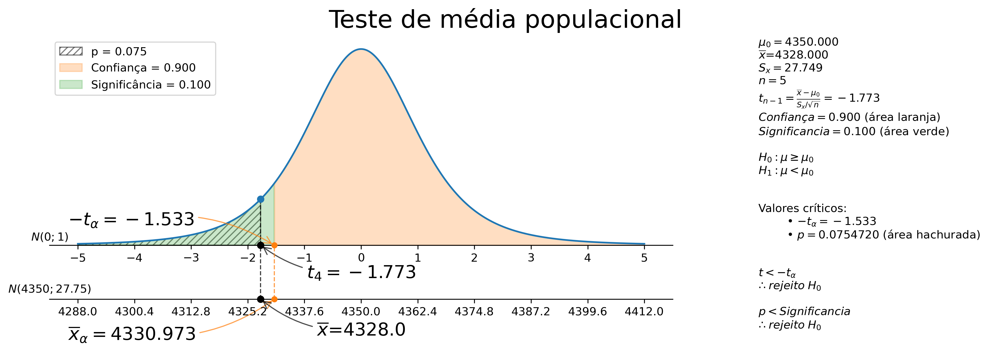

In [50]:
signif = 0.10
conf = 1-signif
pop_mean_test(mu=4350, n=n, x_bar=mean, sigma=std, conf=conf, alt_hip="less", dist='student')

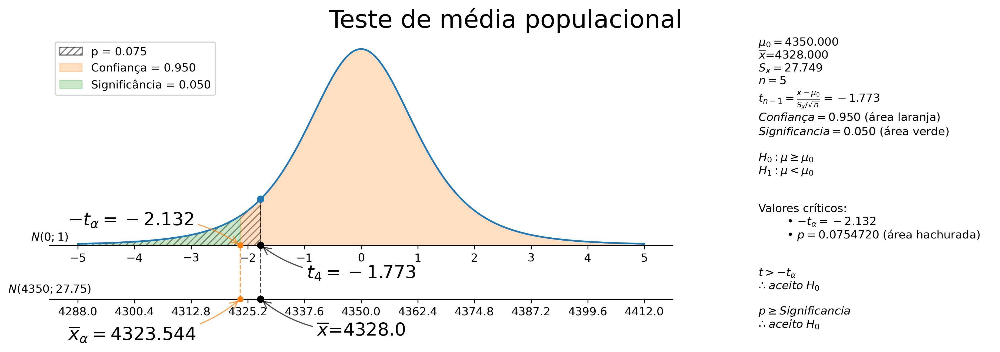

In [51]:
signif = 0.05
conf = 1-signif
pop_mean_test(mu=4350, n=n, x_bar=mean, sigma=std, conf=conf, alt_hip="less", dist='student')

`(gabarito tá estranho, não tá batendo exatamente com o que o ex. pede)`
- at the  10%  level of significance, the mean shear strength of all bolts in the shipment is less than 4350 lb
- at the  5%  level of significance, the mean shear strength of all bolts in the shipment is greater than or equal to 4350 lb

---

A literary historian examines a newly discovered document possibly written by Oberon Theseus. The mean average sentence length of the surviving undisputed works of Oberon Theseus is  48.72  words. The historian counts words in sentences between five successive  101  periods in the document in question to obtain a mean average sentence length of  39.46  words with standard deviation  7.45  words. (Thus the sample size is five.)
1. Determine if these data provide sufficient evidence, at the  1%  level of significance, to conclude that the mean average sentence length in the document is less than  48.72 .
2. Estimate the  p -value of the test.
3. Based on the answers to parts (a) and (b), state whether or not it is likely that the document was written by Oberon Theseus.

- $H_0:\mu\geq48.72$
- $H_1:\mu<448.72350$

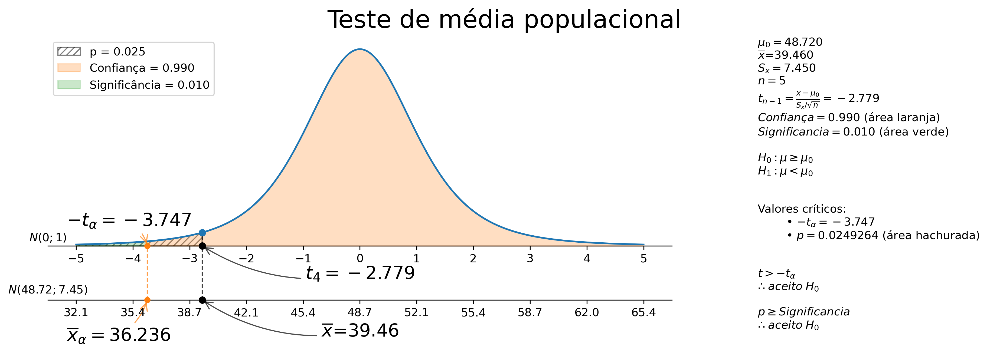

In [52]:
signif = 0.01
conf = 1-signif
pop_mean_test(mu=48.72, n=5, x_bar=39.46, sigma=7.45, conf=conf, alt_hip="less", dist='student')

(ex. sem gabarito)
- $p=0.025 \geq \alpha$
- the data doesn't provide sufficient evidence, at the  1%  level of significance, to conclude that the mean average sentence length in the document is less than  48.72
- the document was likely written by Oberon Theseus